In [24]:
import os
import glob
import random
from typing import List, Tuple, Optional, Dict
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import scipy.io as sio
from tqdm import tqdm
from math import ceil
import torch.nn.functional as F
from skimage.util import view_as_windows
from skimage.metrics import structural_similarity as compare_ssim
import time
from datetime import timedelta
from tqdm import tqdm
from pathlib import Path


In [ ]:
dataset_dir = Path("./dataset")
mat_files = list(dataset_dir.glob("*.mat"))
mat_files.sort(key=lambda f: f.stat().st_mtime)

for idx, file in enumerate(mat_files, start=1):
    new_name = dataset_dir / f"hs{idx}.mat"
    file.rename(new_name)


In [25]:
def load_mat_find_cube(path: str) -> np.ndarray:
    """
    Load .mat and return first reasonably-sized 3D numeric ndarray (H x W x B or B x H x W).
    Normalizes to float32 in [0,1] if possible.
    """
    data = sio.loadmat(path)
    # keep only array-like values
    arrays = []
    for k, v in data.items():
        if isinstance(v, np.ndarray) and v.ndim == 3 and np.issubdtype(v.dtype, np.number):
            arrays.append((k, v))
    if not arrays:
        # fallback: search for 2D arrays stacked as list
        for k, v in data.items():
            if isinstance(v, np.ndarray) and v.ndim == 2 and np.issubdtype(v.dtype, np.number):
                arrays.append((k, v))
    if not arrays:
        raise RuntimeError(f"No 3D arrays found in {path}. Keys: {list(data.keys())}")
    # choose largest volume by total elements
    arrays.sort(key=lambda kv: kv[1].size, reverse=True)
    key, arr = arrays[0]
    arr = arr.astype(np.float32)
    # Many HSI come as (bands, H, W) or (H, W, bands). Decide by sizes:
    if arr.shape[0] <= 50 and arr.shape[1] > 50 and arr.shape[2] > 50:
        # likely (bands, H, W) -> transpose to H x W x bands
        arr = np.transpose(arr, (1, 2, 0))
    # Normalize 0..1
    minv, maxv = arr.min(), arr.max()
    if maxv > 1.0 or minv < 0.0:  # common case: raw reflectance in 0..255 or arbitrary range
        if maxv - minv > 0:
            arr = (arr - minv) / (maxv - minv)
        else:
            arr = np.clip(arr, 0.0, 1.0)
    return arr  # H x W x bands


In [26]:
class HSIDataset(Dataset):
    def __init__(self,
                 mat_files: List[str],
                 cube_size: Tuple[int,int,int] = (64,64,31),
                 stride: Tuple[int,int,int] = (32,32,31),
                 mode: str='train',
                 noise_sigma: float = 25.0,
                 seed: int = 42):
        """
        mat_files: list of paths to .mat files
        cube_size: (h, w, bands) - spectral dimension should match your HSI bands or be <= bands
        stride: stride for extracting overlapping cubes
        mode: 'train' | 'val' | 'test'
        noise_sigma: std of Gaussian noise added (scale 0-255 style -> see usage)
        """
        assert mode in ('train','val','test')
        self.files = mat_files
        self.csize = cube_size
        self.stride = stride
        self.mode = mode
        self.noise_sigma = noise_sigma
        self.rng = np.random.RandomState(seed)
        # Precompute list of cubes (path + (y,x,zstart)) to avoid loading whole files every time
        self.cube_index = []
        print("Building cube index. This may take a while for many files...")
        for p in tqdm(self.files):
            arr = load_mat_find_cube(p)  # H x W x B
            H, W, B = arr.shape
            ch, cw, cb = self.csize
            sh, sw, sb = self.stride
            if cb > B:
                raise ValueError(f"Cube spectral dim {cb} > bands {B} in {p}")
            # spatial windows
            ys = list(range(0, max(1, H-ch+1), sh))
            xs = list(range(0, max(1, W-cw+1), sw))
            # ensure last patch covers end
            if ys and ys[-1] + ch < H:
                ys.append(H-ch)
            if xs and xs[-1] + cw < W:
                xs.append(W-cw)
            # spectral windows (simple: take full bands or sliding if cb < B)
            zs = list(range(0, max(1, B-cb+1), sb))
            if zs and zs[-1] + cb < B:
                zs.append(B-cb)
            for y in ys:
                for x in xs:
                    for z in zs:
                        self.cube_index.append((p, y, x, z))
        print(f"Total cubes: {len(self.cube_index)}")

    def __len__(self):
        return len(self.cube_index)

    def __getitem__(self, idx):
        p, y, x, z = self.cube_index[idx]
        arr = load_mat_find_cube(p)  # H x W x B
        ch, cw, cb = self.csize
        cube = arr[y:y+ch, x:x+cw, z:z+cb]  # H W B
        # convert to C D H W format for 3D convs: (C=1, D=bands, H, W) or (channels=bands?) We'll use shape (bands, H, W)
        clean = np.transpose(cube, (2,0,1)).astype(np.float32)  # (B, H, W)
        # simulate Gaussian noise (scale relative to [0,1])
        sigma = self.noise_sigma / 255.0 if self.noise_sigma > 1 else self.noise_sigma
        noisy = clean + self.rng.normal(0, sigma, size=clean.shape).astype(np.float32)
        noisy = np.clip(noisy, 0.0, 1.0)
        # return tensors: shape (1, B, H, W) or (B, 1, H, W)? We'll use (1, B, H, W) where channel=1 but depth=bands
        # For PyTorch 3D conv, expected input shape: (N, C, D, H, W). We'll set C=1
        noisy_tensor = torch.from_numpy(noisy).unsqueeze(0)  # (1, B, H, W)
        clean_tensor = torch.from_numpy(clean).unsqueeze(0)
        return noisy_tensor, clean_tensor


In [27]:
# --- 3D Transformer patch embedding ---
class PatchEmbedding3D(nn.Module):
    def __init__(self, in_depth:int, patch_size:Tuple[int,int,int], emb_dim:int):
        """
        in_depth: number of spectral bands (depth)
        patch_size: (p_h, p_w, p_d) patch size in voxels; for HSI you may set p_d = patch_depth (like 1 or 4)
        emb_dim: embedding dimension for Transformer
        """
        super().__init__()
        ph, pw, pd = patch_size
        self.ph, self.pw, self.pd = ph, pw, pd
        self.in_depth = in_depth
        # We'll project each flattened patch cube -> emb_dim using a linear layer
        flat_dim = ph * pw * pd  # times 1 channel (we treat spectral as depth)
        # But we need to include spectral meaning: assume input will be shaped (N, C=1, D, H, W)
        # We'll extract non-overlapping 3D patches from D,H,W and flatten (C included)
        self.proj = nn.Linear(flat_dim, emb_dim)

    def forward(self, x):
        # x: (N, C=1, D, H, W)
        N, C, D, H, W = x.shape
        ph, pw, pd = self.ph, self.pw, self.pd
        # require dims divisible (if not, pad)
        pad_d = (pd - D % pd) % pd
        pad_h = (ph - H % ph) % ph
        pad_w = (pw - W % pw) % pw
        if pad_d or pad_h or pad_w:
            x = F.pad(x, (0,pad_w,0,pad_h,0,pad_d))  # pad W, H, D
            N, C, D, H, W = x.shape
        # reshape into patches
        Dp = D // pd
        Hp = H // ph
        Wp = W // pw
        # reorder to extract patches: (N, C, Dp, pd, Hp, ph, Wp, pw)
        x = x.view(N, C, Dp, pd, Hp, ph, Wp, pw)
        x = x.permute(0,2,4,6,1,3,5,7).contiguous()  # (N, Dp, Hp, Wp, C, pd, ph, pw)
        patches = x.view(N, Dp*Hp*Wp, -1)  # (N, num_patches, flat_dim)
        emb = self.proj(patches)  # (N, num_patches, emb_dim)
        return emb, (Dp, Hp, Wp)


In [28]:
# --- Simple Transformer Encoder Block (stack of standard TransformerEncoder layers) ---
class SimpleTransformer3D(nn.Module):
    def __init__(self, emb_dim:int=256, nhead:int=8, nlayers:int=4, dim_feedforward:int=512, dropout:float=0.1):
        super().__init__()
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=emb_dim, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout, batch_first=True
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=nlayers)
        self.norm = nn.LayerNorm(emb_dim)

    def forward(self, x):  # x: (N, num_patches, emb_dim)
        x = self.encoder(x)  # (N, num_patches, emb_dim)
        x = self.norm(x)
        return x


In [29]:
# --- 3D UNet decoder that takes Transformer embeddings reshaped to volumes ---
class UNet3DDecoder(nn.Module):
    def __init__(self, emb_dim:int, grid_shape:Tuple[int,int,int], out_channels:int=1):
        """
        emb_dim: channels from transformer embeddings
        grid_shape: (Dp, Hp, Wp) number of patches along (D,H,W)
        We'll reshape embeddings into (N, emb_dim, Dp, Hp, Wp) and then decode up to input resolution
        """
        super().__init__()
        Dp, Hp, Wp = grid_shape
        self.first_conv = nn.Conv3d(emb_dim, emb_dim, kernel_size=3, padding=1)
        # small decoder with a few transpose convs to upsample to original size (approx)
        self.up1 = nn.ConvTranspose3d(emb_dim, emb_dim//2, kernel_size=2, stride=2)
        self.conv1 = nn.Sequential(nn.Conv3d(emb_dim//2, emb_dim//2, 3, padding=1), nn.ReLU(inplace=True))
        self.up2 = nn.ConvTranspose3d(emb_dim//2, emb_dim//4, kernel_size=2, stride=2)
        self.conv2 = nn.Sequential(nn.Conv3d(emb_dim//4, emb_dim//4, 3, padding=1), nn.ReLU(inplace=True))
        # final conv to produce bands x H x W per sample. We'll produce single-channel residual per band via conv1x1x1
        self.out_conv = nn.Conv3d(emb_dim//4, out_channels, kernel_size=1)

    def forward(self, emb_vol):
        # emb_vol: (N, emb_dim, Dp, Hp, Wp)
        x = self.first_conv(emb_vol)
        x = F.relu(self.up1(x))
        x = self.conv1(x)
        x = F.relu(self.up2(x))
        x = self.conv2(x)
        out = self.out_conv(x)  # (N, out_channels, D_out, H_out, W_out)
        return out


In [30]:
# --- 3D CNN branch (parallel) ---
class Local3DCNNBranch(nn.Module):
    def __init__(self, in_channels=1, hidden=32, num_layers=3):
        super().__init__()
        layers = []
        layers.append(nn.Conv3d(in_channels, hidden, kernel_size=3, padding=1))
        layers.append(nn.ReLU(inplace=True))
        for _ in range(num_layers-2):
            layers.append(nn.Conv3d(hidden, hidden, 3, padding=1))
            layers.append(nn.ReLU(inplace=True))
        layers.append(nn.Conv3d(hidden, in_channels, 1))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        # x: (N, 1, D, H, W)
        return self.net(x)


In [31]:
class UNFOLD_Small(nn.Module):
    def __init__(self,
                 in_bands:int,
                 patch_size=(8,8,8),
                 emb_dim=256,
                 trans_nlayers=6,
                 transformer_heads=8):
        super().__init__()
        self.patch_size = patch_size
        self.emb_dim = emb_dim
        self.patch_embed = PatchEmbedding3D(in_depth=in_bands, patch_size=patch_size, emb_dim=emb_dim)
        self.transformer = SimpleTransformer3D(emb_dim=emb_dim, nhead=transformer_heads, nlayers=trans_nlayers,
                                              dim_feedforward=emb_dim*2)
        # decoder shape will be known at forward
        self.decoder_out_channels = 1  # residual per band/channel grouping; we'll broadcast to bands appropriately
        self.unet_decoder = None  # init lazily when we know grid shape
        self.local_branch = Local3DCNNBranch(in_channels=1, hidden=32, num_layers=3)
        # final fusion conv
        self.fusion_conv = nn.Conv3d(2, 1, kernel_size=1)

    def forward(self, x):
        # x: (N, 1, D, H, W)
        N, C, D, H, W = x.shape
        emb, (Dp, Hp, Wp) = self.patch_embed(x)
        # emb: (N, num_patches, emb_dim)
        emb = self.transformer(emb)
        # reshape to volume
        emb_vol = emb.permute(0,2,1).contiguous().view(N, self.emb_dim, Dp, Hp, Wp)
        # lazy init decoder if needed
        if self.unet_decoder is None:
            # decoder should upsample grid roughly to match D,H,W dimensions; our decoder uses two up-samples of factor 2
            self.unet_decoder = UNet3DDecoder(self.emb_dim, (Dp,Hp,Wp), out_channels=1).to(x.device)
        # decoder_out: (N, 1, D_dec, H_dec, W_dec) -> needs to be resized to (D,H,W)
        dec_out = self.unet_decoder(emb_vol)  # usually smaller than original resolution; upsample to match
        # upsample decoder output to input resolution
        dec_up = F.interpolate(dec_out, size=(D,H,W), mode='trilinear', align_corners=False)
        # local branch: feed input (N,1,D,H,W) through 3D CNN
        local_out = self.local_branch(x)  # (N,1,D,H,W)
        # fuse decoder residual and local via concat -> conv
        fused = torch.cat([dec_up, local_out], dim=1)  # (N,2,D,H,W)
        fused = self.fusion_conv(fused)  # (N,1,D,H,W)
        # final output: consider residual learning (output predicts residual)
        out = x + fused  # denoised
        out = torch.clamp(out, 0.0, 1.0)
        return out


In [32]:
# Simple SSIM loss (windowed) — approximate, works for training
def gaussian_kernel(window_size=11, sigma=1.5):
    coords = np.arange(window_size) - window_size//2
    g = np.exp(-(coords**2)/(2*sigma*sigma))
    g = g / g.sum()
    gg = np.outer(g, g)
    return gg.astype(np.float32)

def ssim_single(img1, img2, window_size=11, K=(0.01,0.03), L=1.0):
    # both are numpy arrays  (H, W) or (D,H,W) flattened per band - but we'll compute bandwise mean SSIM
    # For training use a PyTorch differentiable version below
    raise NotImplementedError

# PyTorch differentiable SSIM (single-scale) for 3D volumes (we’ll adapt a simple version)
class SSIM3DLoss(nn.Module):
    def __init__(self, window_size=7, K=(0.01,0.03), L=1.0):
        super().__init__()
        self.window_size = window_size
        self.K1, self.K2 = K
        self.L = L
        # create separable gaussian kernel for 3D conv weights
        # we'll use simple average pooling as approximation to local mean
        self.pad = window_size // 2

    def forward(self, pred, target):
        # pred, target: (N, 1, D, H, W)
        # compute local means via avg_pool3d
        mu_x = F.avg_pool3d(pred, kernel_size=self.window_size, stride=1, padding=self.pad)
        mu_y = F.avg_pool3d(target, kernel_size=self.window_size, stride=1, padding=self.pad)
        mu_x2 = mu_x * mu_x
        mu_y2 = mu_y * mu_y
        mu_xy = mu_x * mu_y
        sigma_x2 = F.avg_pool3d(pred * pred, kernel_size=self.window_size, stride=1, padding=self.pad) - mu_x2
        sigma_y2 = F.avg_pool3d(target * target, kernel_size=self.window_size, stride=1, padding=self.pad) - mu_y2
        sigma_xy = F.avg_pool3d(pred * target, kernel_size=self.window_size, stride=1, padding=self.pad) - mu_xy
        C1 = (self.K1 * self.L) ** 2
        C2 = (self.K2 * self.L) ** 2
        ssim_map = ((2 * mu_xy + C1) * (2 * sigma_xy + C2)) / ((mu_x2 + mu_y2 + C1) * (sigma_x2 + sigma_y2 + C2) + 1e-12)
        return torch.clamp(1.0 - ssim_map.mean(), 0.0, 1.0)  # loss = 1 - mean SSIM


In [33]:
# training helper
def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    for noisy, clean in tqdm(loader, leave=False):
        noisy = noisy.to(device)  # (N,1,B,H,W)
        clean = clean.to(device)
        optimizer.zero_grad()
        out = model(noisy)
        # compute loss: SSIM + L1
        ssim_loss = criterion(out, clean)
        l1_loss = F.l1_loss(out, clean)
        loss = ssim_loss + 0.5 * l1_loss
        loss.backward()
        optimizer.step()
        total_loss += float(loss.item()) * noisy.size(0)
    return total_loss / len(loader.dataset)

def val_epoch(model, loader, device):
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0
    with torch.no_grad():
        for noisy, clean in tqdm(loader, leave=False):
            noisy = noisy.to(device)
            clean = clean.to(device)
            out = model(noisy)
            # psnr (compute per sample)
            mse = F.mse_loss(out, clean, reduction='none')
            mse = mse.mean(dim=[1,2,3,4])
            psnr = 10.0 * torch.log10(1.0 / (mse + 1e-12))
            total_psnr += psnr.sum().item()
            # ssim - use same criterion but as value
            # We'll reuse SSIM3DLoss to get loss value
            total_loss += float(((1.0 - (1.0 - SSIM3DLoss()(out, clean))) + F.l1_loss(out,clean)).item()) if False else 0.0
    return total_psnr / len(loader.dataset)


In [34]:
import h5py

def load_mat_find_cube(path: str) -> np.ndarray:
    """
    Load .mat (any version) and return first 3D numeric ndarray (H×W×B or B×H×W),
    normalized to [0,1].
    Works with both <v7.3 (via scipy) and v7.3 (via h5py) MAT files.
    """
    def _normalize(arr):
        arr = arr.astype(np.float32)
        # if shape looks like (bands,H,W), swap to (H,W,bands)
        if arr.shape[0] <= 50 and arr.shape[1] > 50 and arr.shape[2] > 50:
            arr = np.transpose(arr, (1, 2, 0))
        # normalize
        minv, maxv = arr.min(), arr.max()
        if maxv > 1.0 or minv < 0.0:
            if maxv > minv:
                arr = (arr - minv) / (maxv - minv)
            else:
                arr = np.clip(arr, 0, 1)
        return arr

    try:
        # first try the normal SciPy loader (works for v7.2 and earlier)
        import scipy.io as sio
        data = sio.loadmat(path)
        for k, v in data.items():
            if isinstance(v, np.ndarray) and v.ndim == 3 and np.issubdtype(v.dtype, np.number):
                return _normalize(v)
    except NotImplementedError:
        pass  # will fall through to h5py

    # fallback: MATLAB v7.3 (HDF5) loader
    with h5py.File(path, "r") as f:
        # find all datasets
        def collect_datasets(g):
            for key, item in g.items():
                if isinstance(item, h5py.Dataset) and item.ndim == 3:
                    yield item[()]
                elif isinstance(item, h5py.Group):
                    yield from collect_datasets(item)
        arrays = list(collect_datasets(f))
        if not arrays:
            raise RuntimeError(f"No 3D datasets found in {path}")
        # pick largest one
        arrays.sort(key=lambda a: a.size, reverse=True)
        arr = arrays[0]
        arr = np.array(arr)
        return _normalize(arr)


In [35]:
example = load_mat_find_cube("./dataset/hs01.mat")
print("Example HxWxB:", example.shape)


Example HxWxB: (1392, 1300, 31)


In [36]:
# paths
dataset_dir = "./dataset"
mat_paths = sorted(glob.glob(os.path.join(dataset_dir, "hs*.mat")))
print("Found .mat files:", len(mat_paths))
# Quick inspect first mat to determine bands
example = load_mat_find_cube(mat_paths[0])
H, W, B = example.shape
print("Example HxWxB:", H, W, B)

# dataset params
cube_spatial = 64
cube_bands = B  # use full bands if your GPU can handle it; otherwise set <= B
cube_size = (cube_spatial, cube_spatial, cube_bands)
stride = (32, 32, cube_bands)  # spectral stride equals cube_bands (no spectral sliding)

# split file list into train/val/test (e.g., 70/15/15 split by files)
random.shuffle(mat_paths)
n = len(mat_paths)
ntrain = int(n*0.6)
nval = int(n*0.2)
train_files = mat_paths[:ntrain]
val_files = mat_paths[ntrain:ntrain+nval]
test_files = mat_paths[ntrain+nval:]

train_ds = HSIDataset(train_files, cube_size=cube_size, stride=stride, mode='train', noise_sigma=25.0)
val_ds = HSIDataset(val_files, cube_size=cube_size, stride=stride, mode='val', noise_sigma=25.0)

batch_size = 2
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=1)


Found .mat files: 20
Example HxWxB: 1392 1300 31
Building cube index. This may take a while for many files...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:21<00:00,  1.79s/it]


Total cubes: 20339
Building cube index. This may take a while for many files...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:07<00:00,  1.82s/it]

Total cubes: 6751


In [39]:
cuda = "CUDA FOUND :D" if torch.cuda.is_available() else "NO CUDA :("
print(cuda)

CUDA FOUND :D


In [40]:
# model, device, optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNFOLD_Small(in_bands=cube_bands, patch_size=(8,8,8), emb_dim=128, trans_nlayers=4, transformer_heads=4).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
criterion = SSIM3DLoss(window_size=7)

# quick forward sanity check with one batch
for noisy, clean in train_loader:
    noisy = noisy.to(device)
    with torch.no_grad():
        out = model(noisy)
    print("input", noisy.shape, "output", out.shape)
    break


input torch.Size([2, 1, 31, 64, 64]) output torch.Size([2, 1, 31, 64, 64])


In [42]:

num_epochs = 3
best_psnr = -1.0
ckpt_dir = "./checkpoints_unfold"
os.makedirs(ckpt_dir, exist_ok=True)

print(f"\nStarting UNFOLD training for {num_epochs} epochs on {device}...")
print(f"Checkpoints will be saved to: {ckpt_dir}\n")

total_start = time.time()

for epoch in range(1, num_epochs + 1):
    print(f"EPOCH {epoch}/{num_epochs}")

    epoch_start = time.time()

    # --- TRAIN ---
    print("\nTraining...")
    model.train()
    running_loss = 0.0
    batch_count = 0

    pbar = tqdm(train_loader, desc=f"[Epoch {epoch}] Training", leave=False)
    for noisy, clean in pbar:
        noisy, clean = noisy.to(device), clean.to(device)
        optimizer.zero_grad()
        out = model(noisy)
        ssim_loss = criterion(out, clean)
        l1_loss = F.l1_loss(out, clean)
        loss = ssim_loss + 0.5 * l1_loss
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        batch_count += 1
        pbar.set_postfix(loss=loss.item())

    train_loss = running_loss / batch_count
    print(f"Epoch {epoch}: Average Training Loss = {train_loss:.6f}")

    # --- VALIDATION ---
    print("\nValidating...")
    model.eval()
    total_psnr = 0.0
    val_batches = 0
    with torch.no_grad():
        pbar_val = tqdm(val_loader, desc=f"[Epoch {epoch}] Validation", leave=False)
        for noisy, clean in pbar_val:
            noisy, clean = noisy.to(device), clean.to(device)
            out = model(noisy)
            mse = F.mse_loss(out, clean, reduction='none')
            mse = mse.mean(dim=[1, 2, 3, 4])
            psnr = 10 * torch.log10(1.0 / (mse + 1e-12))
            total_psnr += psnr.sum().item()
            val_batches += noisy.size(0)

    val_psnr = total_psnr / val_batches
    print(f"Validation PSNR: {val_psnr:.3f} dB")

    # --- CHECKPOINT ---
    epoch_time = timedelta(seconds=(time.time() - epoch_start))
    print(f"Epoch {epoch} completed in {epoch_time}")

    ckpt_path = os.path.join(ckpt_dir, f"unfold_epoch{epoch:03d}.pth")
    torch.save({
        "epoch": epoch,
        "model_state": model.state_dict(),
        "optim_state": optimizer.state_dict(),
    }, ckpt_path)
    print(f"Saved checkpoint -> {ckpt_path}")

`    if val_psnr > best_psnr:
        best_psnr = val_psnr
        best_path = os.path.join(ckpt_dir, "best_unfold.pth")
        torch.save(model.state_dict(), best_path)
        print(f"New best model (Val PSNR = {val_psnr:.3f}) saved as {best_path}")

    print("-" * 80)

# --- TOTAL TIME ---
total_time = timedelta(seconds=(time.time() - total_start))
print(f"\nTraining completed in total time: {total_time}")
print(f"Best validation PSNR achieved: {best_psnr:.3f} dB\n")




Starting UNFOLD training for 3 epochs on cuda...
Checkpoints will be saved to: ./checkpoints_unfold

EPOCH 1/3

Training...


Epoch 1: Average Training Loss = 0.083996

Validating...


Validation PSNR: 36.269 dB
Epoch 1 completed in 8:36:35.966054
Saved checkpoint -> ./checkpoints_unfold/unfold_epoch001.pth
New best model (Val PSNR = 36.269) saved as ./checkpoints_unfold/best_unfold.pth
--------------------------------------------------------------------------------
EPOCH 2/3

Training...


Epoch 2: Average Training Loss = 0.066156

Validating...


Validation PSNR: 36.223 dB
Epoch 2 completed in 9:05:19.811179
Saved checkpoint -> ./checkpoints_unfold/unfold_epoch002.pth
--------------------------------------------------------------------------------
EPOCH 3/3

Training...


Epoch 3: Average Training Loss = 0.063386

Validating...


Validation PSNR: 34.855 dB
Epoch 3 completed in 8:38:01.765994
Saved checkpoint -> ./checkpoints_unfold/unfold_epoch003.pth
--------------------------------------------------------------------------------

Training completed in total time: 1 day, 2:19:57.662924
Best validation PSNR achieved: 36.269 dB



In [43]:
def denoise_full_image(model: nn.Module, hsi: np.ndarray, cube_size=(64,64,31), stride=(32,32,31), device='cpu'):
    """
    hsi: H x W x B
    returns denoised H x W x B
    """
    model.eval()
    ch, cw, cb = cube_size
    sh, sw, sb = stride
    H, W, B = hsi.shape
    # prepare output accumulators
    out_acc = np.zeros_like(hsi, dtype=np.float32)
    weight_acc = np.zeros_like(hsi, dtype=np.float32)
    with torch.no_grad():
        for y in range(0, max(1, H-ch+1), sh):
            if y+ch > H: y = H-ch
            for x in range(0, max(1, W-cw+1), sw):
                if x+cw > W: x = W-cw
                for z in range(0, max(1, B-cb+1), sb):
                    if z+cb > B: z = B-cb
                    cube = hsi[y:y+ch, x:x+cw, z:z+cb]
                    inp = torch.from_numpy(np.transpose(cube, (2,0,1)).astype(np.float32)).unsqueeze(0).unsqueeze(0).to(device)
                    out = model(inp)  # (1,1,B,H,W)
                    out_np = out.squeeze(0).squeeze(0).cpu().numpy()  # (B,H,W)
                    out_np = np.transpose(out_np, (1,2,0))  # H W B
                    out_acc[y:y+ch, x:x+cw, z:z+cb] += out_np
                    weight_acc[y:y+ch, x:x+cw, z:z+cb] += 1.0
    # avoid div by zero
    denom = np.maximum(weight_acc, 1e-8)
    denoised = out_acc / denom
    denoised = np.clip(denoised, 0.0, 1.0)
    return denoised


In [45]:
# Example usage (after training):
model.load_state_dict(torch.load("./checkpoints_unfold/best_unfold.pth"))
sample_hsi = load_mat_find_cube(mat_paths[-1])
denoised = denoise_full_image(model.to(device), sample_hsi, cube_size=cube_size, stride=stride, device=device)
np.save("denoised_sample.npy", denoised)


In [46]:
# Load best model checkpoint
best_model_path = "./checkpoints_unfold/best_unfold.pth"
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print(f"Loaded best model from: {best_model_path}")

# Load the target HSI file (hs20.mat)
target_path = "./dataset/hs20.mat"
hsi = load_mat_find_cube(target_path)'
print("Loaded:", target_path, "Shape:", hsi.shape)  # (H, W, Bands)

Loaded best model from: ./checkpoints_unfold/best_unfold.pth
Loaded: ./dataset/hs20.mat Shape: (1392, 1300, 31)


In [49]:
denoised_hsi = denoise_full_image(
    model.to(device),
    hsi,
    cube_size=(64, 64, hsi.shape[2]),
    stride=(32, 32, hsi.shape[2]),
    device=device
)

print("Denoising complete. Shape:", denoised_hsi.shape)


Denoising complete. Shape: (1392, 1300, 31)


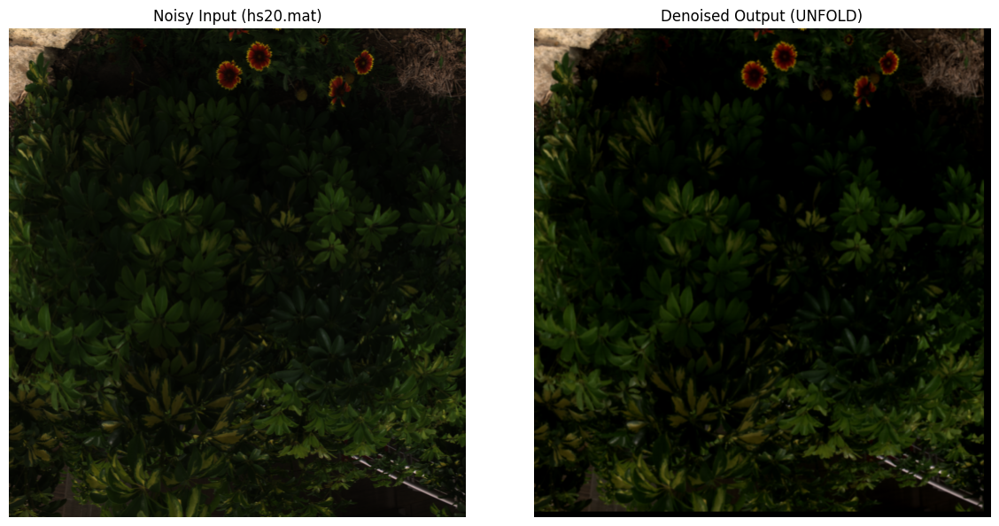

In [53]:
import matplotlib.pyplot as plt
bands = hsi.shape[2]
r_band, g_band, b_band = int(bands * 0.7), int(bands * 0.5), int(bands * 0.3)

def make_rgb(hsi):
    rgb = np.stack([
        hsi[:, :, r_band],
        hsi[:, :, g_band],
        hsi[:, :, b_band]
    ], axis=-1)
    rgb = np.clip(rgb, 0, 1)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    return rgb

rgb_noisy = make_rgb(hsi)
rgb_denoised = make_rgb(denoised_hsi)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(rgb_noisy)
plt.title("Noisy Input (hs20.mat)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(rgb_denoised)
plt.title("Denoised Output (UNFOLD)")
plt.axis("off")

plt.tight_layout()
plt.show()


Loaded trained model from: ./checkpoints_unfold/best_unfold.pth
Processing files: ['./dataset/hs15.mat', './dataset/hs16.mat', './dataset/hs17.mat', './dataset/hs18.mat', './dataset/hs19.mat', './dataset/hs20.mat']

Denoising hs15.mat ...

Denoising hs16.mat ...

Denoising hs17.mat ...

Denoising hs18.mat ...

Denoising hs19.mat ...

Denoising hs20.mat ...


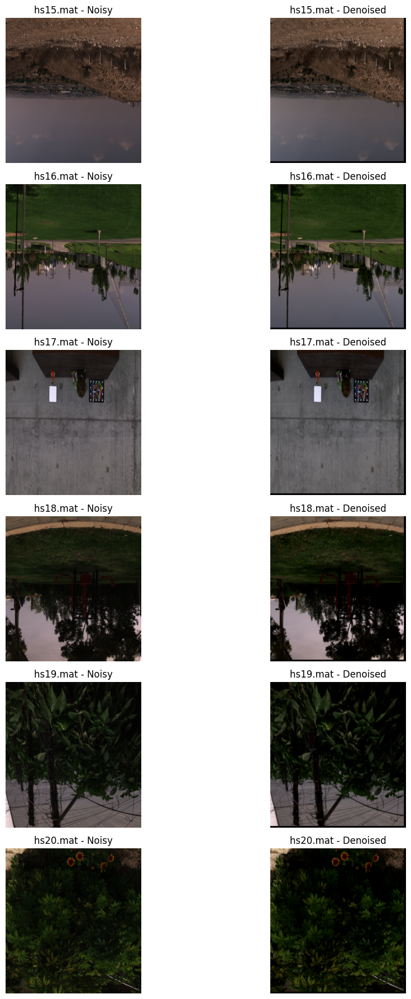

In [54]:
import matplotlib.pyplot as plt
import numpy as np
import torch, glob, os

# Load trained model
best_model_path = "./checkpoints_unfold/best_unfold.pth"
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
model.to(device)
print(f"Loaded trained model from: {best_model_path}")

# Select the files hs15–hs20
dataset_dir = "./dataset"
target_files = [os.path.join(dataset_dir, f"hs{i:02d}.mat") for i in range(15, 21)]
print("Processing files:", target_files)

# Choose approximate RGB band indices (adjust if colors look off)
def make_rgb(hsi):
    bands = hsi.shape[2]
    r_band, g_band, b_band = int(bands * 0.7), int(bands * 0.5), int(bands * 0.3)
    rgb = np.stack([hsi[:, :, r_band],
                    hsi[:, :, g_band],
                    hsi[:, :, b_band]], axis=-1)
    rgb = np.clip(rgb, 0, 1)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    return rgb

# Create figure grid
num_images = len(target_files)
plt.figure(figsize=(12, num_images * 3))

for idx, fpath in enumerate(target_files, 1):
    print(f"\nDenoising {os.path.basename(fpath)} ...")
    noisy_hsi = load_mat_find_cube(fpath)
    
    denoised_hsi = denoise_full_image(
        model,
        noisy_hsi,
        cube_size=(64, 64, noisy_hsi.shape[2]),
        stride=(32, 32, noisy_hsi.shape[2]),
        device=device
    )

    rgb_noisy = make_rgb(noisy_hsi)
    rgb_denoised = make_rgb(denoised_hsi)

    # Plot: noisy (left), denoised (right)
    plt.subplot(num_images, 2, 2*(idx-1) + 1)
    plt.imshow(rgb_noisy)
    plt.title(f"{os.path.basename(fpath)} - Noisy")
    plt.axis("off")

    plt.subplot(num_images, 2, 2*(idx-1) + 2)
    plt.imshow(rgb_denoised)
    plt.title(f"{os.path.basename(fpath)} - Denoised")
    plt.axis("off")

plt.tight_layout()
plt.show()


Processing hs15.mat ...
Processing hs16.mat ...
Processing hs17.mat ...
Processing hs18.mat ...
Processing hs19.mat ...
Processing hs20.mat ...


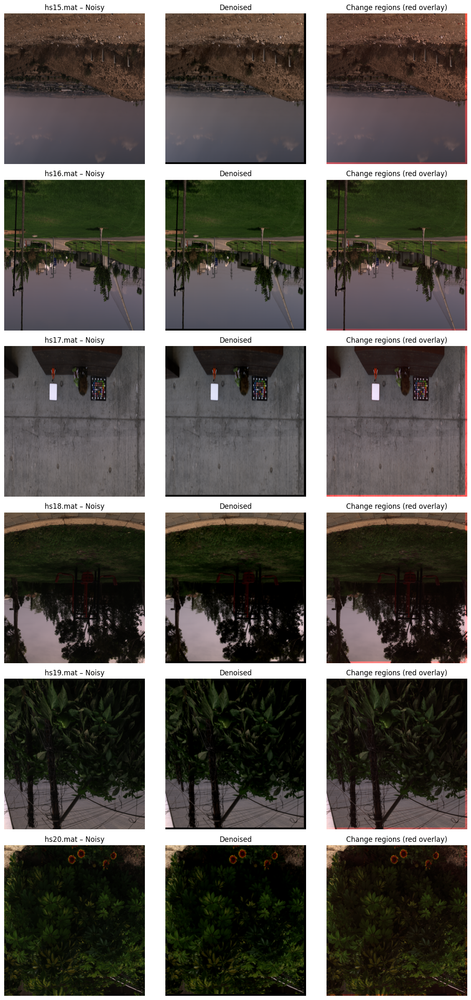

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import os

def make_rgb(hsi):
    bands = hsi.shape[2]
    r_band, g_band, b_band = int(bands * 0.7), int(bands * 0.5), int(bands * 0.3)
    rgb = np.stack([hsi[:, :, r_band],
                    hsi[:, :, g_band],
                    hsi[:, :, b_band]], axis=-1)
    rgb = np.clip(rgb, 0, 1)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    return rgb

def highlight_changes(noisy, denoised):
    # absolute per-band difference
    diff_map = np.mean(np.abs(denoised - noisy), axis=2)
    diff_map = (diff_map - diff_map.min()) / (diff_map.max() - diff_map.min() + 1e-8)
    rgb_noisy = make_rgb(noisy)
    rgb_denoised = make_rgb(denoised)
    overlay = rgb_noisy.copy()
    overlay[..., 0] = np.clip(overlay[..., 0] + diff_map * 0.8, 0, 1)  # red overlay
    return rgb_noisy, rgb_denoised, overlay, diff_map

# Paths hs15-hs20
dataset_dir = "./dataset"
target_files = [os.path.join(dataset_dir, f"hs{i:02d}.mat") for i in range(15, 21)]

plt.figure(figsize=(12, len(target_files) * 4))

for idx, fpath in enumerate(target_files, 1):
    print(f"Processing {os.path.basename(fpath)} ...")
    noisy_hsi = load_mat_find_cube(fpath)

    denoised_hsi = denoise_full_image(
        model,
        noisy_hsi,
        cube_size=(64, 64, noisy_hsi.shape[2]),
        stride=(32, 32, noisy_hsi.shape[2]),
        device=device
    )

    rgb_noisy, rgb_denoised, overlay, diff_map = highlight_changes(noisy_hsi, denoised_hsi)

    # Row of 3 columns: Noisy | Denoised | Red Overlay
    row = (idx - 1) * 3
    plt.subplot(len(target_files), 3, row + 1)
    plt.imshow(rgb_noisy)
    plt.title(f"{os.path.basename(fpath)} – Noisy")
    plt.axis("off")

    plt.subplot(len(target_files), 3, row + 2)
    plt.imshow(rgb_denoised)
    plt.title("Denoised")
    plt.axis("off")

    plt.subplot(len(target_files), 3, row + 3)
    plt.imshow(overlay)
    plt.title("Change regions (red overlay)")
    plt.axis("off")

plt.tight_layout()
plt.show()


Processing hs15.mat ...
Processing hs16.mat ...
Processing hs17.mat ...
Processing hs18.mat ...
Processing hs19.mat ...
Processing hs20.mat ...


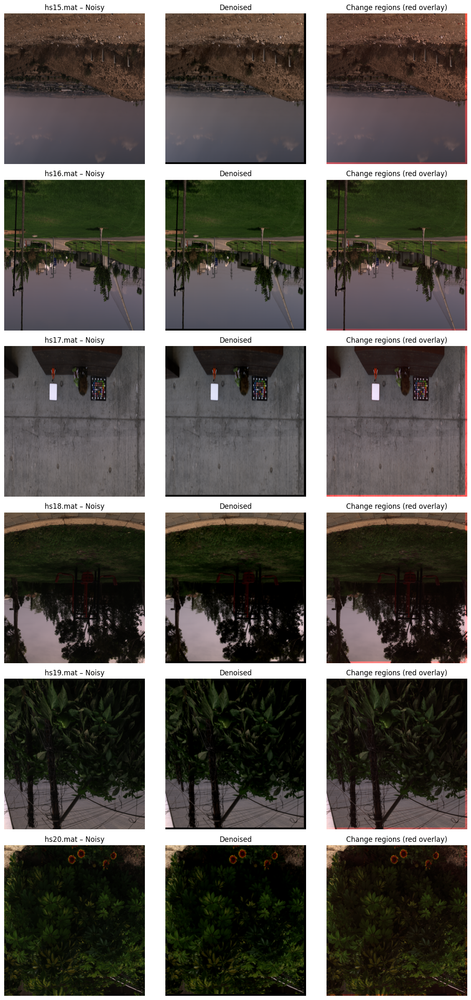


Saved comparison grid as test.png


In [58]:
import numpy as np
import matplotlib.pyplot as plt
import os

def make_rgb(hsi):
    bands = hsi.shape[2]
    r_band, g_band, b_band = int(bands * 0.7), int(bands * 0.5), int(bands * 0.3)
    rgb = np.stack([hsi[:, :, r_band],
                    hsi[:, :, g_band],
                    hsi[:, :, b_band]], axis=-1)
    rgb = np.clip(rgb, 0, 1)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    return rgb

def highlight_changes(noisy, denoised):
    # Compute absolute per-band difference
    diff_map = np.mean(np.abs(denoised - noisy), axis=2)
    diff_map = (diff_map - diff_map.min()) / (diff_map.max() - diff_map.min() + 1e-8)

    # Generate RGB images and overlay
    rgb_noisy = make_rgb(noisy)
    rgb_denoised = make_rgb(denoised)
    overlay = rgb_noisy.copy()
    overlay[..., 0] = np.clip(overlay[..., 0] + diff_map * 0.8, 0, 1)  # add red tint

    return rgb_noisy, rgb_denoised, overlay, diff_map


# --------------------------------------------------------------------------
# Denoise hs15–hs20 and visualize
# --------------------------------------------------------------------------
dataset_dir = "./dataset"
target_files = [os.path.join(dataset_dir, f"hs{i:02d}.mat") for i in range(15, 21)]

fig, axes = plt.subplots(len(target_files), 3, figsize=(12, len(target_files) * 4))
if len(target_files) == 1:
    axes = axes.reshape(1, 3)

for idx, fpath in enumerate(target_files):
    print(f"Processing {os.path.basename(fpath)} ...")
    noisy_hsi = load_mat_find_cube(fpath)

    denoised_hsi = denoise_full_image(
        model,
        noisy_hsi,
        cube_size=(64, 64, noisy_hsi.shape[2]),
        stride=(32, 32, noisy_hsi.shape[2]),
        device=device
    )

    rgb_noisy, rgb_denoised, overlay, diff_map = highlight_changes(noisy_hsi, denoised_hsi)

    # Noisy
    axes[idx, 0].imshow(rgb_noisy)
    axes[idx, 0].set_title(f"{os.path.basename(fpath)} – Noisy")
    axes[idx, 0].axis("off")

    # Denoised
    axes[idx, 1].imshow(rgb_denoised)
    axes[idx, 1].set_title("Denoised")
    axes[idx, 1].axis("off")

    # Red overlay (change map)
    axes[idx, 2].imshow(overlay)
    axes[idx, 2].set_title("Change regions (red overlay)")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.savefig("test.png", dpi=200, bbox_inches="tight")
plt.show()

print("\nSaved comparison grid as test.png")


Processing hs15.mat with extra noise (σ=0.1) ...
Processing hs16.mat with extra noise (σ=0.1) ...
Processing hs17.mat with extra noise (σ=0.1) ...
Processing hs18.mat with extra noise (σ=0.1) ...
Processing hs19.mat with extra noise (σ=0.1) ...
Processing hs20.mat with extra noise (σ=0.1) ...


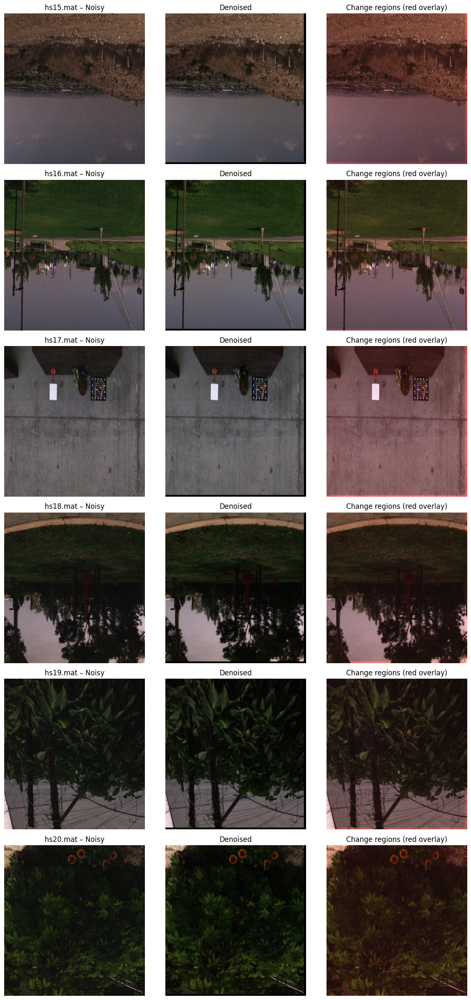


Saved visibly noisy test results as test_harsh_noise.png


In [59]:
import numpy as np
import matplotlib.pyplot as plt
import os

def make_rgb(hsi):
    bands = hsi.shape[2]
    r_band, g_band, b_band = int(bands * 0.7), int(bands * 0.5), int(bands * 0.3)
    rgb = np.stack([hsi[:, :, r_band],
                    hsi[:, :, g_band],
                    hsi[:, :, b_band]], axis=-1)
    rgb = np.clip(rgb, 0, 1)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    return rgb

def highlight_changes(noisy, denoised):
    diff_map = np.mean(np.abs(denoised - noisy), axis=2)
    diff_map = (diff_map - diff_map.min()) / (diff_map.max() - diff_map.min() + 1e-8)
    rgb_noisy = make_rgb(noisy)
    rgb_denoised = make_rgb(denoised)
    overlay = rgb_noisy.copy()
    overlay[..., 0] = np.clip(overlay[..., 0] + diff_map * 0.8, 0, 1)
    return rgb_noisy, rgb_denoised, overlay

# --------------------------------------------------------------------------
# Add harsher noise to hs15–hs20 and test denoising
# --------------------------------------------------------------------------
dataset_dir = "./dataset"
target_files = [os.path.join(dataset_dir, f"hs{i:02d}.mat") for i in range(15, 21)]

# stronger noise sigma (e.g., 0.1 = 25.5 intensity in 0–255 scale)
sigma = 0.10  

fig, axes = plt.subplots(len(target_files), 3, figsize=(12, len(target_files) * 4))
if len(target_files) == 1:
    axes = axes.reshape(1, 3)

for idx, fpath in enumerate(target_files):
    print(f"Processing {os.path.basename(fpath)} with extra noise (σ={sigma}) ...")

    clean_hsi = load_mat_find_cube(fpath)
    # add strong visible Gaussian noise
    noisy_hsi = np.clip(clean_hsi + np.random.normal(0, sigma, clean_hsi.shape).astype(np.float32), 0, 1)

    denoised_hsi = denoise_full_image(
        model,
        noisy_hsi,
        cube_size=(64, 64, noisy_hsi.shape[2]),
        stride=(32, 32, noisy_hsi.shape[2]),
        device=device
    )

    rgb_noisy, rgb_denoised, overlay = highlight_changes(noisy_hsi, denoised_hsi)

    axes[idx, 0].imshow(rgb_noisy)
    axes[idx, 0].set_title(f"{os.path.basename(fpath)} – Noisy")
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(rgb_denoised)
    axes[idx, 1].set_title("Denoised")
    axes[idx, 1].axis("off")

    axes[idx, 2].imshow(overlay)
    axes[idx, 2].set_title("Change regions (red overlay)")
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.savefig("test_harsh_noise.png", dpi=200, bbox_inches="tight")
plt.show()

print("\nSaved visibly noisy test results as test_harsh_noise.png")
